### EDA for Atlanta ###

- For Frame of Reference:
| Year   |      Start of DST      |  End of DST |
|----------|:-------------:|------:|
| 2016 | March 13 | November 6 |
| 2017 | March 12 | November 5 |
| 2018 | March 11 | November 4 |
| 2019 | March 10 | November 3 |
| 2020 | March 8 | November 2 |

source: https://en.wikipedia.org/wiki/Main_Page

**Imports**

In [1]:
import pandas as pd
pd.set_option("display.max_columns", None)

import numpy as np
import seaborn as sns
sns.set(style = "darkgrid")

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import datetime as dt

### Reading In Data ###

In [2]:
#original data:
atl_df_og = pd.read_csv('../data/atl_accidents.csv')

In [3]:
atl_df_og.head(3)

,id,severity,start_time,end_time,start_lat,start_lng,end_lat,end_lng,distance(mi),description,number,street,side,city,county,state,zipcode,country,timezone,airport_code,weather_timestamp,temperature(f),wind_chill(f),humidity(%),pressure(in),visibility(mi),wind_direction,wind_speed(mph),precipitation(in),weather_condition,amenity,bump,crossing,give_way,junction,no_exit,railway,roundabout,station,stop,traffic_calming,traffic_signal,turning_loop,sunrise_sunset,civil_twilight,nautical_twilight,astronomical_twilight
0,A-2749192,3,2016-11-30 17:35:55,2016-11-30 23:35:55,32.83752,-83.64864,32.840424,-83.646307,0.242,At US-41-BR/Forsyth St/Exit 164 - Accident.,NaN,I-75 N,R,Macon,Bibb,GA,31201,US,US/Eastern,KMCN,2016-11-30 17:53:00,66.0,NaN,90.0,29.79,4.0,West,9.2,0.24,Rain,False,False,False,False,True,False,False,False,False,False,False,False,False,Night,Day,Day,Day
1,A-2749196,2,2016-11-30 17:39:56,2016-11-30 23:39:56,33.74153,-84.41434,33.746580,-84.430340,0.983,Between Ashby St/Exit 55 and Langhorn St/Exit ...,NaN,GA-402 W,R,Atlanta,Fulton,GA,30310,US,US/Eastern,KATL,2016-11-30 17:46:00,62.6,NaN,100.0,29.80,8.0,West,9.2,0.00,Mostly Cloudy,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Day,Day,Day
2,A-2749218,2,2016-11-30 18:09:52,2016-12-01 00:09:52,33.91220,-84.38390,33.911380,-84.372580,0.652,At US-19/Roswell Rd/Exit 25 - Accident.,NaN,I-285 E,R,Atlanta,Fulton,GA,30342,US,US/Eastern,KPDK,2016-11-30 18:04:00,63.0,NaN,90.0,29.80,10.0,West,9.2,NaN,Overcast,False,False,False,False,True,False,False,False,False,False,False,False,False,Night,Night,Day,Day


In [4]:
atl_df_og.shape

(26114, 47)

In [5]:
atl_df_og.columns

Index(['id', 'severity', 'start_time', 'end_time', 'start_lat', 'start_lng',
       'end_lat', 'end_lng', 'distance(mi)', 'description', 'number', 'street',
       'side', 'city', 'county', 'state', 'zipcode', 'country', 'timezone',
       'airport_code', 'weather_timestamp', 'temperature(f)', 'wind_chill(f)',
       'humidity(%)', 'pressure(in)', 'visibility(mi)', 'wind_direction',
       'wind_speed(mph)', 'precipitation(in)', 'weather_condition', 'amenity',
       'bump', 'crossing', 'give_way', 'junction', 'no_exit', 'railway',
       'roundabout', 'station', 'stop', 'traffic_calming', 'traffic_signal',
       'turning_loop', 'sunrise_sunset', 'civil_twilight', 'nautical_twilight',
       'astronomical_twilight'],
      dtype='object')

In [6]:
#cleaned data:
atl_df = pd.read_csv('../data/atl_df_cleaned.csv')

In [7]:
atl_df.head(3)

,severity,start_lat,start_lng,end_lat,end_lng,distance(mi),temperature(f),wind_chill(f),humidity(%),pressure(in),visibility(mi),wind_speed(mph),precipitation(in),amenity,bump,crossing,give_way,junction,no_exit,railway,roundabout,station,stop,traffic_calming,traffic_signal,turning_loop,start_time_ep,end_time_ep,weather_timestamp_ep,year,month,week,accident_duration,side_L,side_R,wind_direction_CALM,wind_direction_E,wind_direction_ENE,wind_direction_ESE,wind_direction_N,wind_direction_NE,wind_direction_NNE,wind_direction_NNW,wind_direction_NW,wind_direction_S,wind_direction_SE,wind_direction_SSE,wind_direction_SSW,wind_direction_SW,wind_direction_VAR,wind_direction_W,wind_direction_WNW,wind_direction_WSW,weather_condition_Clear,weather_condition_Cloudy,weather_condition_Cloudy / Windy,weather_condition_Drizzle,weather_condition_Drizzle and Fog,weather_condition_Fair,weather_condition_Fair / Windy,weather_condition_Fog,weather_condition_Haze,weather_condition_Heavy Drizzle,weather_condition_Heavy Rain,weather_condition_Heavy Rain / Windy,weather_condition_Heavy Rain Shower,weather_condition_Heavy T-Storm,weather_condition_Heavy Thunderstorms and Rain,weather_condition_Light Drizzle,weather_condition_Light Drizzle / Windy,weather_condition_Light Freezing Rain,weather_condition_Light Ice Pellets,weather_condition_Light Rain,weather_condition_Light Rain / Windy,weather_condition_Light Rain Shower,weather_condition_Light Rain with Thunder,weather_condition_Light Snow,weather_condition_Light Snow / Windy,weather_condition_Light Thunderstorms and Rain,weather_condition_Mist,weather_condition_Mostly Cloudy,weather_condition_Mostly Cloudy / Windy,weather_condition_N/A Precipitation,weather_condition_Overcast,weather_condition_Partly Cloudy,weather_condition_Partly Cloudy / Windy,weather_condition_Rain,weather_condition_Rain / Windy,weather_condition_Rain Shower,weather_condition_Rain Showers,weather_condition_Scattered Clouds,weather_condition_Smoke,weather_condition_Snow,weather_condition_Squalls / Windy,weather_condition_T-Storm / Windy,weather_condition_Thunder,weather_condition_Thunder / Windy,weather_condition_Thunder in the Vicinity,weather_condition_Thunderstorm,weather_condition_Thunderstorms and Rain,weather_condition_Wintry Mix,weather_condition_Wintry Mix / Windy,sunrise_sunset_Day,sunrise_sunset_Night,sunrise_sunset_nan,civil_twilight_Day,civil_twilight_Night,civil_twilight_nan,nautical_twilight_Day,nautical_twilight_Night,nautical_twilight_nan,astronomical_twilight_Day,astronomical_twilight_Night,astronomical_twilight_nan,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday,hour_00,hour_01,hour_02,hour_03,hour_04,hour_05,hour_06,hour_07,hour_08,hour_09,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23
0,3,32.83752,-83.64864,32.840424,-83.646307,0.242,66.0,66.0,90.0,29.79,4.0,9.2,0.24,0,0,0,0,1,0,0,0,0,0,0,0,0,1.480527e+09,1.480549e+09,1.480528e+09,2016,11,48,21600.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,2,33.74153,-84.41434,33.746580,-84.430340,0.983,62.6,62.6,100.0,29.80,8.0,9.2,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,1.480528e+09,1.480549e+09,1.480528e+09,2016,11,48,21600.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,2,33.91220,-84.38390,33.911380,-84.372580,0.652,63.0,63.0,90.0,29.80,10.0,9.2,0.00,0,0,0,0,1,0,0,0,0,0,0,0,0,1.480529e+09,1.480551e+09,1.480529e+09,2016,11,48,21600.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0

In [8]:
atl_df.shape

(23630, 145)

In [9]:
atl_df.columns[:35]

Index(['severity', 'start_lat', 'start_lng', 'end_lat', 'end_lng',
       'distance(mi)', 'temperature(f)', 'wind_chill(f)', 'humidity(%)',
       'pressure(in)', 'visibility(mi)', 'wind_speed(mph)',
       'precipitation(in)', 'amenity', 'bump', 'crossing', 'give_way',
       'junction', 'no_exit', 'railway', 'roundabout', 'station', 'stop',
       'traffic_calming', 'traffic_signal', 'turning_loop', 'start_time_ep',
       'end_time_ep', 'weather_timestamp_ep', 'year', 'month', 'week',
       'accident_duration', 'side_L', 'side_R'],
      dtype='object')

### EDA ###

**Visualizations of Original Data**

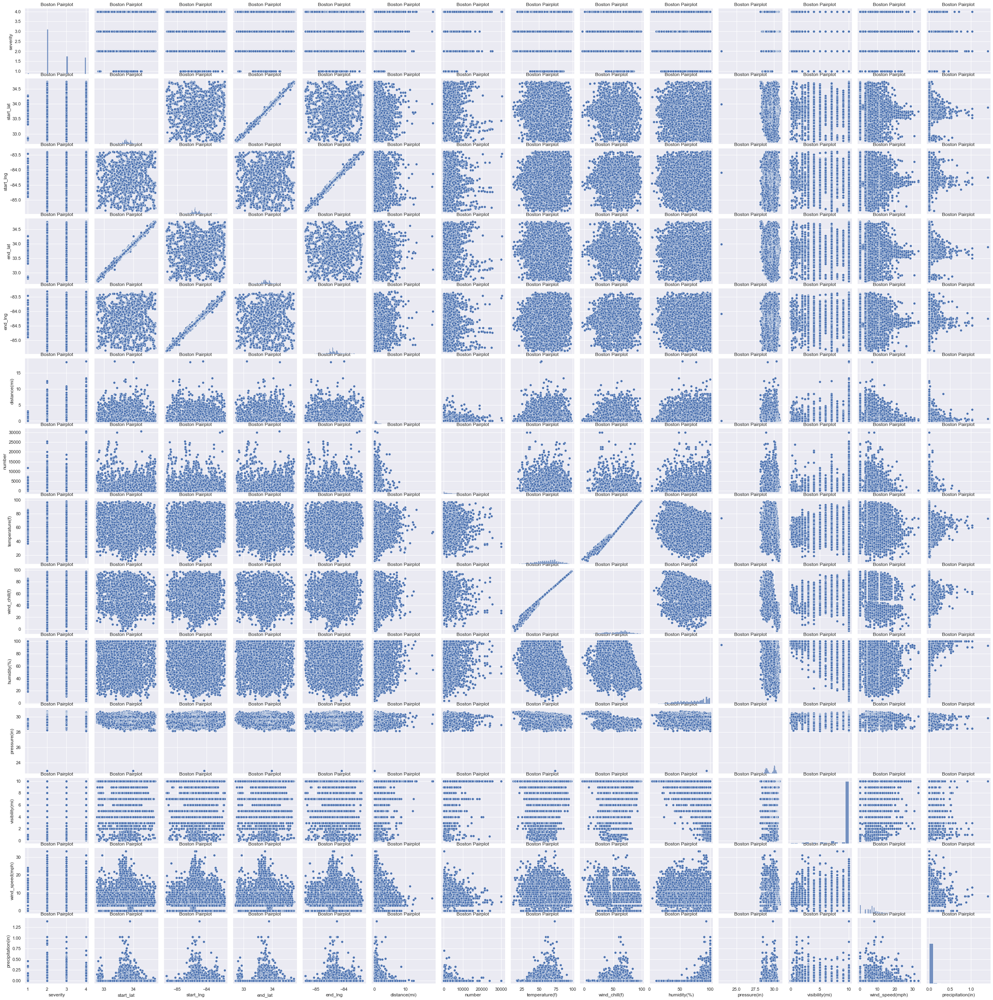

In [10]:
#pairplot for Atlanta
sns.pairplot(atl_df_og[['severity', 'start_time', 'end_time', 'start_lat', 'start_lng',
       'end_lat', 'end_lng', 'distance(mi)', 'number', 'weather_timestamp',
       'temperature(f)', 'wind_chill(f)', 'humidity(%)', 'pressure(in)',
       'visibility(mi)', 'wind_speed(mph)', 'precipitation(in)']]).set(title = 'Boston Pairplot');

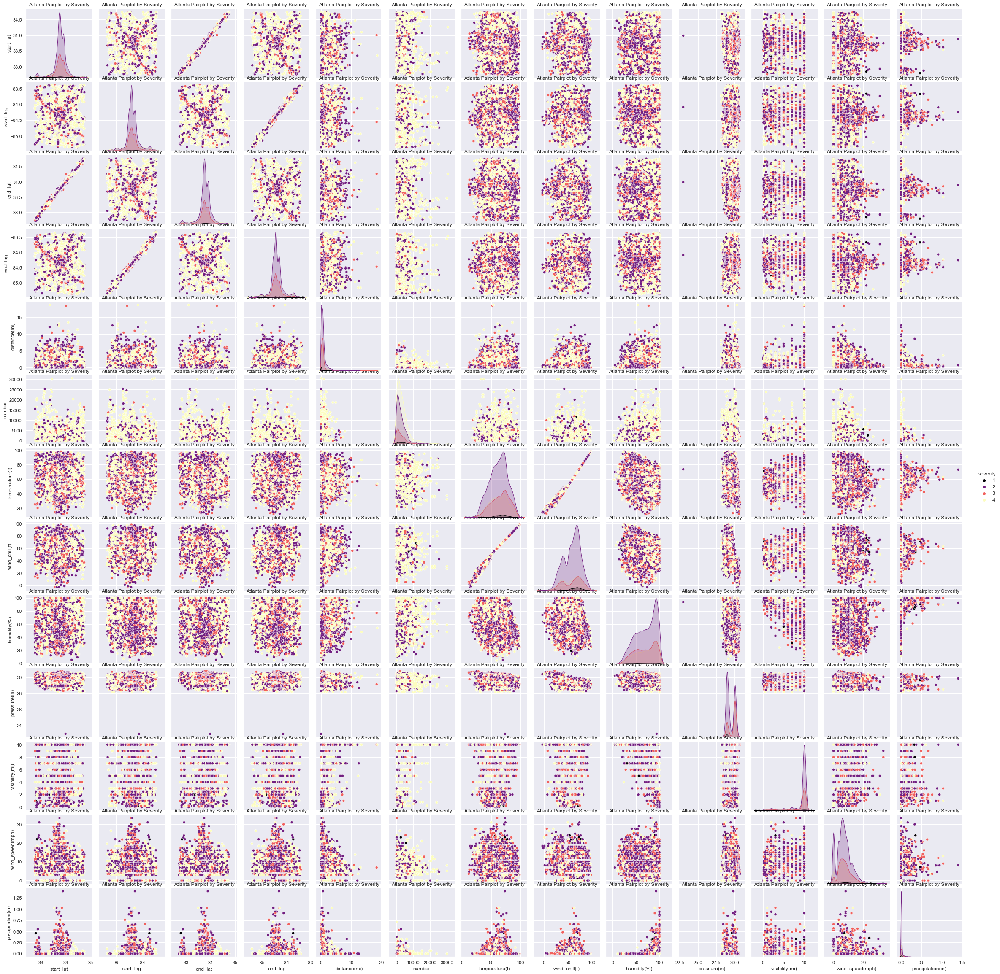

In [11]:
#pairplot for Atlanta, hued by Severity
sns.pairplot(atl_df_og[['severity', 'start_time', 'end_time', 'start_lat', 'start_lng',
       'end_lat', 'end_lng', 'distance(mi)', 'number', 'weather_timestamp',
       'temperature(f)', 'wind_chill(f)', 'humidity(%)', 'pressure(in)',
       'visibility(mi)', 'wind_speed(mph)', 'precipitation(in)']], hue = 'severity', palette = 'magma').set(title= 'Atlanta Pairplot by Severity');

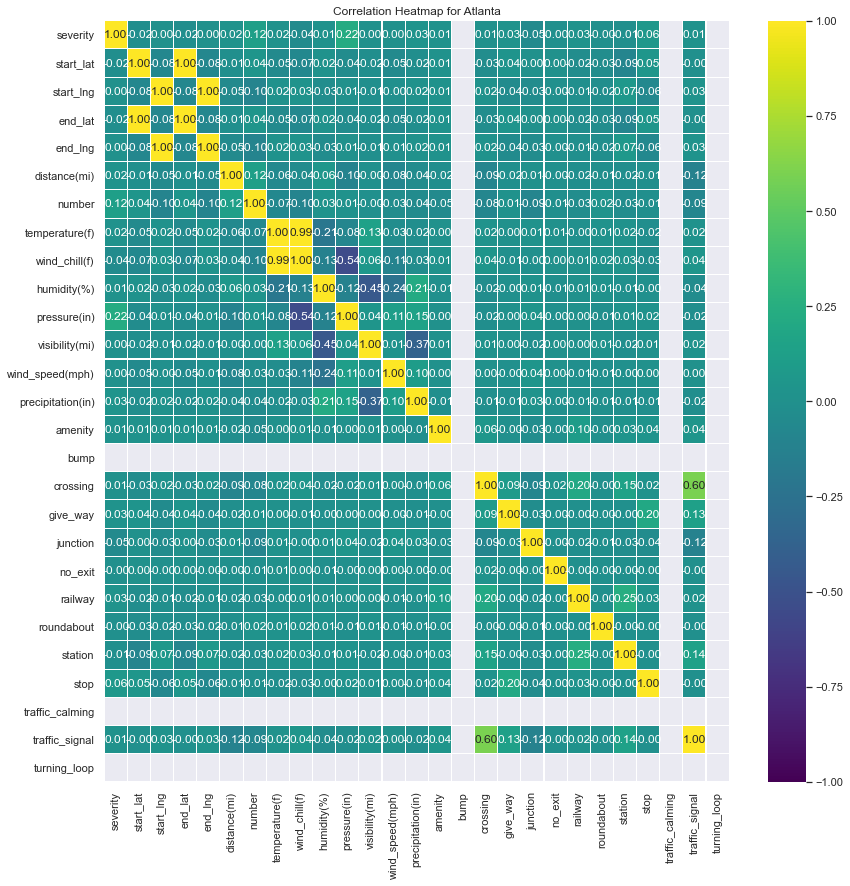

In [12]:
#corr heatmap for Atlanta
plt.figure(figsize = (14, 14))
sns.heatmap(atl_df_og.corr(),
            annot = True,
            fmt = '.2f',
            linewidth = .1,
            vmin = -1,
            vmax = 1,
            cmap = 'viridis')
plt.title('Correlation Heatmap for Atlanta');

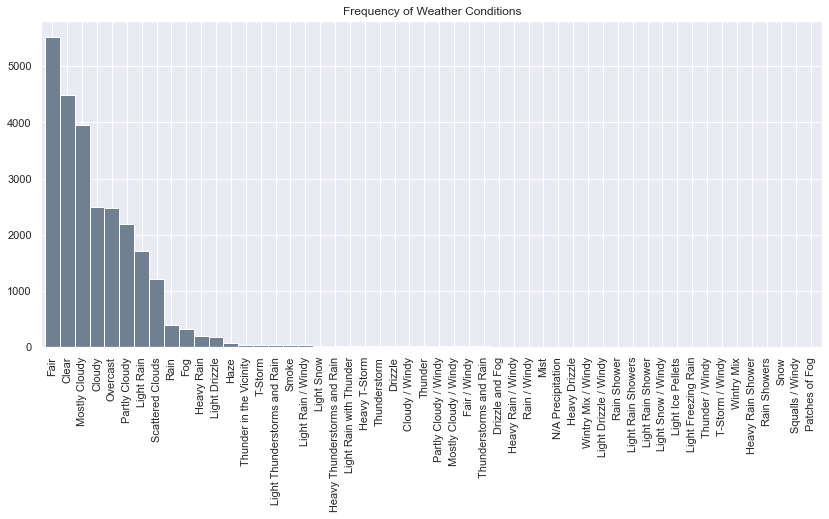

In [13]:
#bar plot of weather conditions for Atlanta
atl_df_og['weather_condition'].value_counts().plot(kind = 'bar',
                                                   figsize=(14, 6),
                                                   width = 1,
                                                   color = 'slategrey',
                                                   title = 'Frequency of Weather Conditions');

In [14]:
#renaming certain wind_direction values
atl_df_og['wind_direction'].replace({
        'North': 'N',
        'South': 'S',
        'West' : 'W',
        'East' : 'E',
        'Calm' : 'CALM',
        'Variable': 'VAR'
    }, inplace = True)

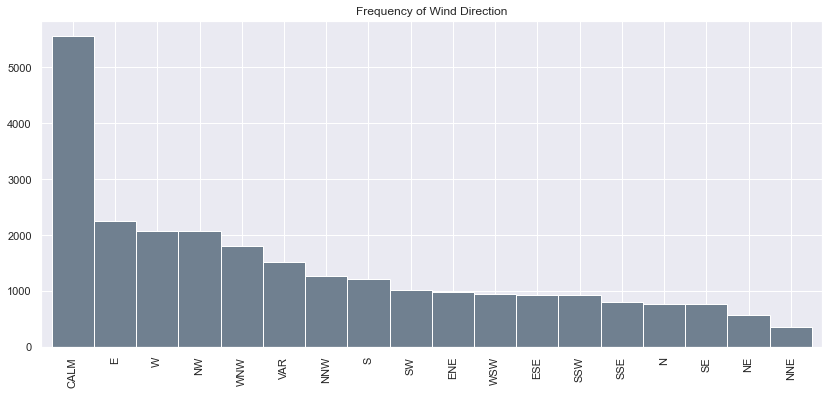

In [15]:
#bar plot of wind_direction for Chicago
atl_df_og['wind_direction'].value_counts().plot(kind = 'bar',
                                                   figsize=(14, 6),
                                                   width = 1,
                                                   color = 'slategrey',
                                                   title = 'Frequency of Wind Direction');

In [16]:
#taking note of earlist available value
atl_df_og['start_time'].sort_values()

2347               2016-06-17 15:51:51
2348               2016-06-17 16:35:28
2349               2016-06-21 07:55:49
2350               2016-06-21 07:55:49
2351               2016-06-21 09:31:50
                     ...              
10059              2020-12-31 21:59:00
9998               2020-12-31 21:59:00
6840               2020-12-31 21:59:00
6627     2020-12-31 21:59:00.000000000
7548               2020-12-31 22:27:00
Name: start_time, Length: 26114, dtype: object

**Exploring Cleaned Data**

In [17]:
atl_df.shape

(23630, 145)

In [18]:
#descriptive statistics for Atlanta
atl_df[['severity', 'start_time_ep', 'end_time_ep', 'weather_timestamp_ep', 
        'start_lat', 'start_lng', 'end_lat', 'end_lng', 'distance(mi)', 
       'temperature(f)', 'wind_chill(f)', 'humidity(%)', 'pressure(in)',
       'visibility(mi)', 'wind_speed(mph)', 'precipitation(in)', 'accident_duration']].describe().drop('count').T

,mean,std,min,25%,50%,75%,max
severity,2.659966e+00,8.215131e-01,1.000000e+00,2.000000e+00,2.000000e+00,3.000000e+00,4.000000e+00
start_time_ep,1.545623e+09,4.366614e+07,1.466179e+09,1.508920e+09,1.546297e+09,1.587299e+09,1.609454e+09
end_time_ep,1.545638e+09,4.365923e+07,1.466200e+09,1.508942e+09,1.546299e+09,1.587303e+09,1.609458e+09
weather_timestamp_ep,1.545623e+09,4.366617e+07,1.466179e+09,1.508921e+09,1.546297e+09,1.587298e+09,1.609453e+09
start_lat,3.375649e+01,2.802550e-01,3.275601e+01,3.367247e+01,3.376609e+01,3.389895e+01,3.474771e+01
start_lng,-8.435605e+01,2.752510e-01,-8.537133e+01,-8.448642e+01,-8.438338e+01,-8.424793e+01,-8.338659e+01
end_lat,3.375664e+01,2.805239e-01,3.271712e+01,3.367362e+01,3.376537e+01,3.389928e+01,3.476697e+01
end_lng,-8.435577e+01,2.756077e-01,-8.537133e+01,-8.448508e+01,-8.438366e+01,-8.424765e+01,-8.335159e+01
distance(mi),7.137184e-01,1.034268e+00,0.000000e+00,1.600000e-01,4.640000e-01,7.880000e-01,1.866200e+01
temperature(f),6.341441e+01,1.536984e+01,1.170000e+01,5.200000e+01,6.490000e+01,7.500000e+01,9.800000e+01


In [19]:
#a normalized value_count of accident severity
atl_df['severity'].value_counts(normalize = True).sort_index()

1    0.011342
2    0.531231
3    0.243546
4    0.213881
Name: severity, dtype: float64

**Exploring the frequency of accidents**

In [20]:
#function to generate count plots
def make_countplot(dataframe,
                   x, y = None,
                   hue = None,
                   palette = None):
    
    return sns.countplot(data = dataframe,
                         x = x,
                         hue = hue,
                         palette = palette)

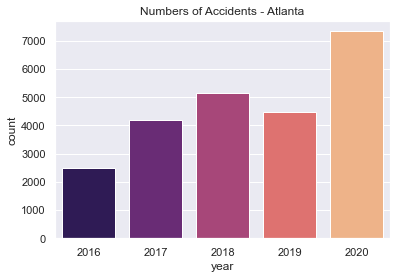

In [21]:
#Overall number of Accidents - Atlanta
make_countplot(atl_df, 'year', palette = 'magma')
plt.title('Numbers of Accidents - Atlanta')
plt.show();

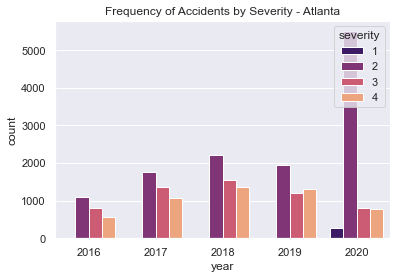

In [22]:
#Frequency of Accidents by Sev. for Atlanta
make_countplot(atl_df, x = 'year', hue = 'severity', palette = 'magma')
plt.title('Frequency of Accidents by Severity - Atlanta')
plt.show();

#are '1' severity accidents under reported?
#remember severity is: a number between 1 and 4,
#where 1 indicates the least impact on traffic 
#(i.e., short delay as a result of the accident) and
#4 indicates a significant impact on traffic (i.e., long delay).	

In [23]:
#function to generate histplots
def make_histplot(dataframe, x, y = None, color = None, kde = True):
    sns.histplot(data = dataframe, x = x, y = y, color = color, kde = kde)
    plt.title('Frequency of Accidents by Week')
    return plt.show()

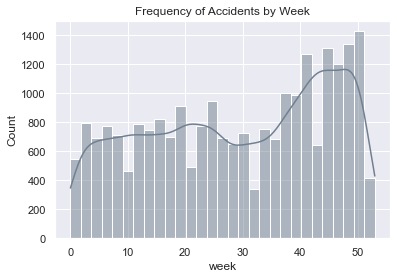

In [24]:
make_histplot(atl_df, x = 'week', color = 'slategrey')
#could the drop around weeks 27, 28 be attributed to the 4th of July holiday?

In [25]:
#function to generate kdeplots
def make_kdeplot(dataframe,
                 shade = True,
                 color = None):
    
    return sns.kdeplot(data = dataframe,
                shade = shade,
                color = color);

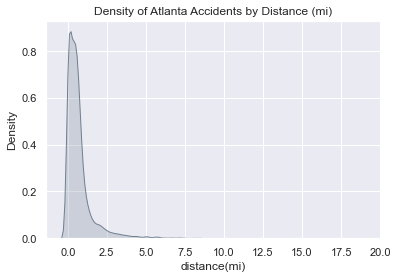

In [26]:
#kde plot for Atlanta's distance
make_kdeplot(atl_df['distance(mi)'], color = 'slategrey')
plt.title('Density of Atlanta Accidents by Distance (mi)')
plt.show()

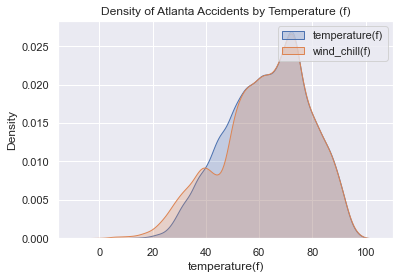

In [27]:
#Looking at weather variables for Atlanta

#https://www.python-graph-gallery.com/74-density-plot-of-several-variables
fig = make_kdeplot(atl_df['temperature(f)'], shade = True)
fig = make_kdeplot(atl_df['wind_chill(f)'], shade = True)
plt.title('Density of Atlanta Accidents by Temperature (f)')
plt.legend(labels = ['temperature(f)', 'wind_chill(f)'])
plt.show()

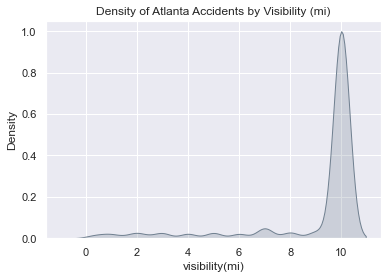

In [28]:
#kde plot for Atlanta's visbility distance
make_kdeplot(atl_df['visibility(mi)'], color = 'slategrey')
plt.title('Density of Atlanta Accidents by Visibility (mi)')
plt.show()

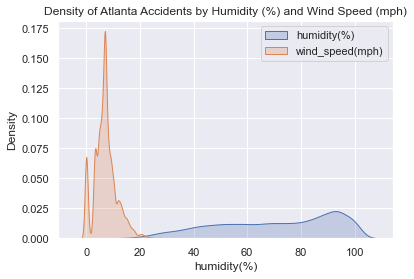

In [29]:
#combined kde plots for Atlanta's humidity(%), and wind_speed(mph)
fig = make_kdeplot(atl_df['humidity(%)'])
fig = make_kdeplot(atl_df['wind_speed(mph)'])
plt.title('Density of Atlanta Accidents by Humidity (%) and Wind Speed (mph)')
plt.legend(labels = ['humidity(%)', 'wind_speed(mph)'])
plt.show()

**Trying to Plot the 'Shape' of the Cities**

In [30]:
#https://matplotlib.org/3.3.0/gallery/text_labels_and_annotations/titles_demo.html

#function to generate jointplots
def make_jointplot(x, y,
                   kind = 'kde',
                   fill = True, 
                   color = None):
    
    return sns.jointplot(x = x, y = y,
                         kind = kind,
                         fill = fill,
                         color = color)

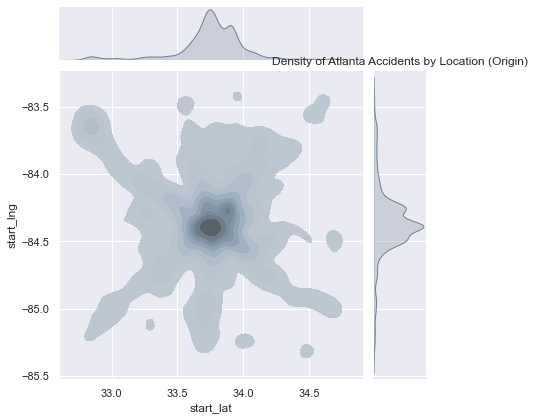

In [31]:
#Density of Atlanta's accidents
make_jointplot(x = atl_df["start_lat"],
               y = atl_df["start_lng"],
               kind = 'kde',
               fill = True, 
               color = 'slategrey')
plt.title('Density of Atlanta Accidents by Location (Origin)')
plt.show()

In [32]:
#function to generate jointplots - hex kind
def make_jointplothex(x, y,
                   kind = 'hex',
                   color = None):
    
    return sns.jointplot(x = x, y = y,
                         kind = kind,
                         color = color)

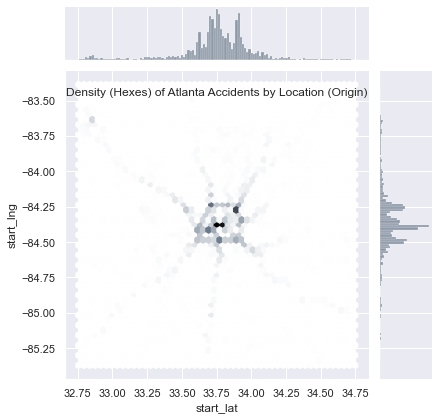

In [33]:
#Density of Atlanta's accidents - hexes
make_jointplothex(x = atl_df["start_lat"],
                  y = atl_df["start_lng"],
                  kind = 'hex',
                  color = 'slategrey')
plt.title('Density (Hexes) of Atlanta Accidents by Location (Origin)', 
          y = 0.9)
plt.show();

In [34]:
#function to generate scatterplots
def make_scatterplot(x, y, s, alpha):
    #setting figure size
    plt.figure(figsize=(10, 10))
    
    #setting x and y labels
    plt.xlabel('Starting Latitude')
    plt.ylabel('Starting Longitude')
    
    #making plot
    return plt.scatter(x = x,
                       y = y,
                       s = s,
                       alpha = 0.5)

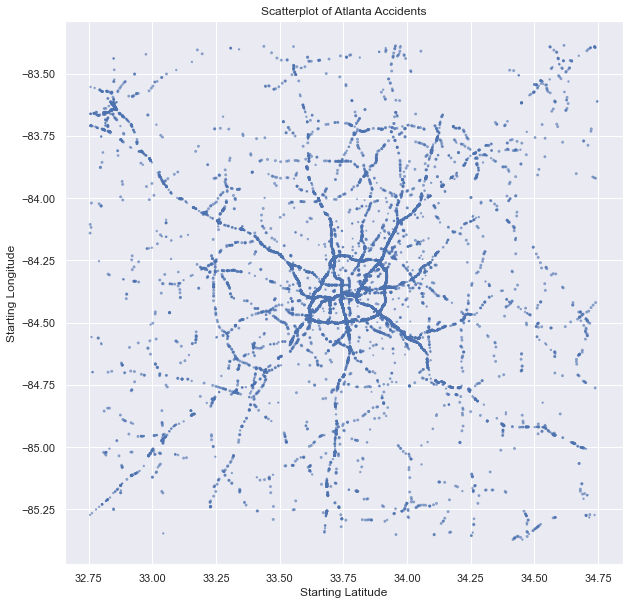

In [35]:
#scatterplot of Atlanta
make_scatterplot(x = atl_df['start_lat'],
                 y = atl_df['start_lng'],
                 s = atl_df['severity'],
                 alpha = 0.5)
plt.title('Scatterplot of Atlanta Accidents');

In [36]:
#function to generate hued scatterplots
def make_hued_scatterplot(x, y, c, cmap, alpha):
    #setting figure size:
    plt.figure(figsize=(10, 10))
    
    #setting x and y labels:
    plt.xlabel('Starting Latitude')
    plt.ylabel('Starting Longitude')
    
    #making plot:
    scatter = plt.scatter(x = x,
                          y = y,
                          c = c,
                          cmap = cmap,
                          alpha = 0.5)
    
    #setting legend:
    plt.legend(handles = scatter.legend_elements()[0], labels = [1, 2, 3, 4])
    
    #making plot
    return scatter

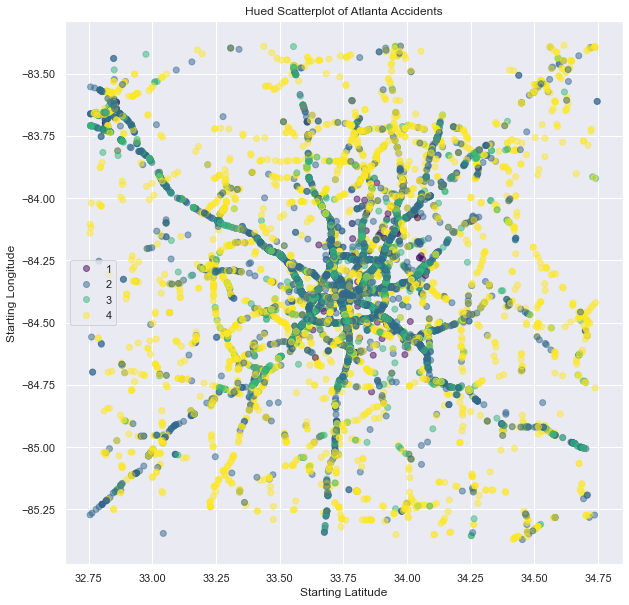

In [37]:
make_hued_scatterplot(x = atl_df['start_lat'],
                      y = atl_df['start_lng'],
                      c = atl_df['severity'],
                      cmap = 'viridis',
                      alpha = 0.5)
plt.title('Hued Scatterplot of Atlanta Accidents');

**Exploring Time Intervals**

- For Frame of Reference

| Human-readable Time |      Seconds      |
|----------|:-------------:|
| 1 hour | 3600 seconds |
| 1 day | 86400 seconds |
| 1 week | 604800 seconds |
| 1 month (30.44 days) | 2629743 seconds |
| 1 hour (365.24 days) | 31556926 seconds |

source: https://www.epochconverter.com/

In [38]:
atl_df_time_convert = pd.to_datetime(atl_df['start_time_ep'], unit = 's')
atl_df_time_convert = pd.DataFrame(atl_df_time_convert)
atl_df_time_convert.head(3)

,start_time_ep
0,2016-11-30 17:35:55
1,2016-11-30 17:39:56
2,2016-11-30 18:09:52


In [39]:
atl_df_time_convert.rename(columns = {'start_time_ep': 'start_time'}, inplace = True)
atl_df_time_convert.head()

,start_time
0,2016-11-30 17:35:55
1,2016-11-30 17:39:56
2,2016-11-30 18:09:52
3,2016-11-30 18:44:53
4,2016-11-30 18:56:16


In [40]:
atl_df_time_convert = atl_df_time_convert.sort_values('start_time')
atl_df_time_convert.head()

,start_time
2302,2016-06-17 15:51:51
2303,2016-06-17 16:35:28
2304,2016-06-21 07:55:49
2305,2016-06-21 07:55:49
2306,2016-06-21 09:31:50


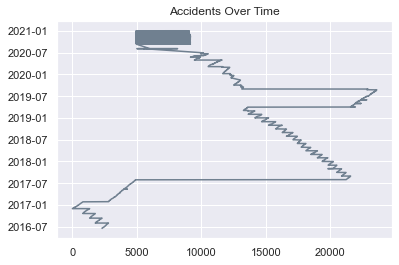

In [41]:
#https://www.python-graph-gallery.com/242-area-chart-and-faceting
plt.plot(atl_df_time_convert, color = 'slategrey')
plt.title("Accidents Over Time");

In [42]:
atl_df.columns[0:35]

Index(['severity', 'start_lat', 'start_lng', 'end_lat', 'end_lng',
       'distance(mi)', 'temperature(f)', 'wind_chill(f)', 'humidity(%)',
       'pressure(in)', 'visibility(mi)', 'wind_speed(mph)',
       'precipitation(in)', 'amenity', 'bump', 'crossing', 'give_way',
       'junction', 'no_exit', 'railway', 'roundabout', 'station', 'stop',
       'traffic_calming', 'traffic_signal', 'turning_loop', 'start_time_ep',
       'end_time_ep', 'weather_timestamp_ep', 'year', 'month', 'week',
       'accident_duration', 'side_L', 'side_R'],
      dtype='object')

In [43]:
#trying to pinpoint the 'average' accident severity and location:
mean_accident_loc = atl_df[['severity', 'start_lat', 'start_lng', 'end_lat', 'end_lng']].mean()
loc_dict = dict(mean_accident_loc)
loc_dict

{'severity': 2.659966144731274,
 'start_lat': 33.75648802560275,
 'start_lng': -84.35605463914555,
 'end_lat': 33.75663881620751,
 'end_lng': -84.3557697855284}

In [44]:
print(loc_dict.keys())
print(loc_dict.values())

dict_keys(['severity', 'start_lat', 'start_lng', 'end_lat', 'end_lng'])
dict_values([2.659966144731274, 33.75648802560275, -84.35605463914555, 33.75663881620751, -84.3557697855284])


**Looking At Individual Years, Months, and Days of DST**

In [45]:
atl_2016 = atl_df.loc[atl_df['year'] == 2016]
atl_2017 = atl_df.loc[atl_df['year'] == 2017]
atl_2018 = atl_df.loc[atl_df['year'] == 2018]
atl_2019 = atl_df.loc[atl_df['year'] == 2019]
atl_2020 = atl_df.loc[atl_df['year'] == 2020]

In [46]:
print(atl_2016.shape[0])
print(atl_2017.shape[0])
print(atl_2018.shape[0])
print(atl_2019.shape[0])
print(atl_2020.shape[0])

2475
4207
5135
4471
7342


In [47]:
atl_2016.head(3)

,severity,start_lat,start_lng,end_lat,end_lng,distance(mi),temperature(f),wind_chill(f),humidity(%),pressure(in),visibility(mi),wind_speed(mph),precipitation(in),amenity,bump,crossing,give_way,junction,no_exit,railway,roundabout,station,stop,traffic_calming,traffic_signal,turning_loop,start_time_ep,end_time_ep,weather_timestamp_ep,year,month,week,accident_duration,side_L,side_R,wind_direction_CALM,wind_direction_E,wind_direction_ENE,wind_direction_ESE,wind_direction_N,wind_direction_NE,wind_direction_NNE,wind_direction_NNW,wind_direction_NW,wind_direction_S,wind_direction_SE,wind_direction_SSE,wind_direction_SSW,wind_direction_SW,wind_direction_VAR,wind_direction_W,wind_direction_WNW,wind_direction_WSW,weather_condition_Clear,weather_condition_Cloudy,weather_condition_Cloudy / Windy,weather_condition_Drizzle,weather_condition_Drizzle and Fog,weather_condition_Fair,weather_condition_Fair / Windy,weather_condition_Fog,weather_condition_Haze,weather_condition_Heavy Drizzle,weather_condition_Heavy Rain,weather_condition_Heavy Rain / Windy,weather_condition_Heavy Rain Shower,weather_condition_Heavy T-Storm,weather_condition_Heavy Thunderstorms and Rain,weather_condition_Light Drizzle,weather_condition_Light Drizzle / Windy,weather_condition_Light Freezing Rain,weather_condition_Light Ice Pellets,weather_condition_Light Rain,weather_condition_Light Rain / Windy,weather_condition_Light Rain Shower,weather_condition_Light Rain with Thunder,weather_condition_Light Snow,weather_condition_Light Snow / Windy,weather_condition_Light Thunderstorms and Rain,weather_condition_Mist,weather_condition_Mostly Cloudy,weather_condition_Mostly Cloudy / Windy,weather_condition_N/A Precipitation,weather_condition_Overcast,weather_condition_Partly Cloudy,weather_condition_Partly Cloudy / Windy,weather_condition_Rain,weather_condition_Rain / Windy,weather_condition_Rain Shower,weather_condition_Rain Showers,weather_condition_Scattered Clouds,weather_condition_Smoke,weather_condition_Snow,weather_condition_Squalls / Windy,weather_condition_T-Storm / Windy,weather_condition_Thunder,weather_condition_Thunder / Windy,weather_condition_Thunder in the Vicinity,weather_condition_Thunderstorm,weather_condition_Thunderstorms and Rain,weather_condition_Wintry Mix,weather_condition_Wintry Mix / Windy,sunrise_sunset_Day,sunrise_sunset_Night,sunrise_sunset_nan,civil_twilight_Day,civil_twilight_Night,civil_twilight_nan,nautical_twilight_Day,nautical_twilight_Night,nautical_twilight_nan,astronomical_twilight_Day,astronomical_twilight_Night,astronomical_twilight_nan,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday,hour_00,hour_01,hour_02,hour_03,hour_04,hour_05,hour_06,hour_07,hour_08,hour_09,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23
0,3,32.83752,-83.64864,32.840424,-83.646307,0.242,66.0,66.0,90.0,29.79,4.0,9.2,0.24,0,0,0,0,1,0,0,0,0,0,0,0,0,1.480527e+09,1.480549e+09,1.480528e+09,2016,11,48,21600.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,2,33.74153,-84.41434,33.746580,-84.430340,0.983,62.6,62.6,100.0,29.80,8.0,9.2,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,1.480528e+09,1.480549e+09,1.480528e+09,2016,11,48,21600.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,2,33.91220,-84.38390,33.911380,-84.372580,0.652,63.0,63.0,90.0,29.80,10.0,9.2,0.00,0,0,0,0,1,0,0,0,0,0,0,0,0,1.480529e+09,1.480551e+09,1.480529e+09,2016,11,48,21600.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0

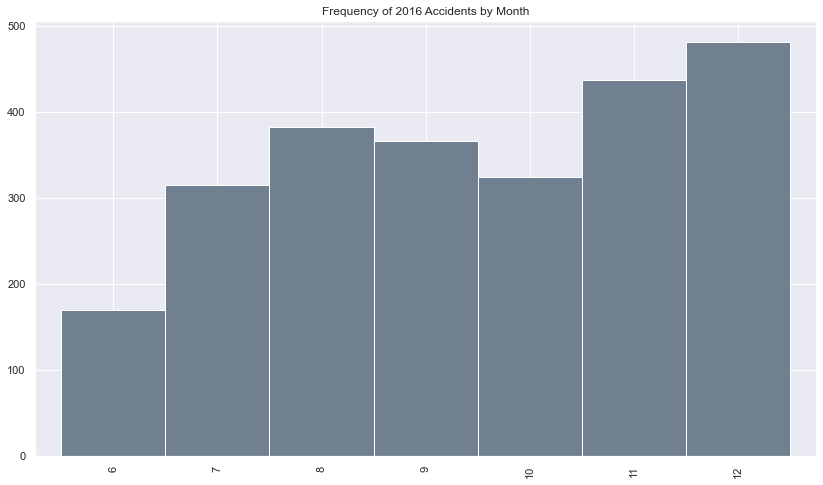

In [68]:
#bar plot of 2016 accident frequencies
atl_2016['month'].value_counts().sort_index().plot(kind = 'bar',
                                                   figsize=(14, 8),
                                                   width = 1,
                                                   color = 'slategrey',
                                                   title = 'Frequency of 2016 Accidents by Month');

In [49]:
atl_2017.head(3)

,severity,start_lat,start_lng,end_lat,end_lng,distance(mi),temperature(f),wind_chill(f),humidity(%),pressure(in),visibility(mi),wind_speed(mph),precipitation(in),amenity,bump,crossing,give_way,junction,no_exit,railway,roundabout,station,stop,traffic_calming,traffic_signal,turning_loop,start_time_ep,end_time_ep,weather_timestamp_ep,year,month,week,accident_duration,side_L,side_R,wind_direction_CALM,wind_direction_E,wind_direction_ENE,wind_direction_ESE,wind_direction_N,wind_direction_NE,wind_direction_NNE,wind_direction_NNW,wind_direction_NW,wind_direction_S,wind_direction_SE,wind_direction_SSE,wind_direction_SSW,wind_direction_SW,wind_direction_VAR,wind_direction_W,wind_direction_WNW,wind_direction_WSW,weather_condition_Clear,weather_condition_Cloudy,weather_condition_Cloudy / Windy,weather_condition_Drizzle,weather_condition_Drizzle and Fog,weather_condition_Fair,weather_condition_Fair / Windy,weather_condition_Fog,weather_condition_Haze,weather_condition_Heavy Drizzle,weather_condition_Heavy Rain,weather_condition_Heavy Rain / Windy,weather_condition_Heavy Rain Shower,weather_condition_Heavy T-Storm,weather_condition_Heavy Thunderstorms and Rain,weather_condition_Light Drizzle,weather_condition_Light Drizzle / Windy,weather_condition_Light Freezing Rain,weather_condition_Light Ice Pellets,weather_condition_Light Rain,weather_condition_Light Rain / Windy,weather_condition_Light Rain Shower,weather_condition_Light Rain with Thunder,weather_condition_Light Snow,weather_condition_Light Snow / Windy,weather_condition_Light Thunderstorms and Rain,weather_condition_Mist,weather_condition_Mostly Cloudy,weather_condition_Mostly Cloudy / Windy,weather_condition_N/A Precipitation,weather_condition_Overcast,weather_condition_Partly Cloudy,weather_condition_Partly Cloudy / Windy,weather_condition_Rain,weather_condition_Rain / Windy,weather_condition_Rain Shower,weather_condition_Rain Showers,weather_condition_Scattered Clouds,weather_condition_Smoke,weather_condition_Snow,weather_condition_Squalls / Windy,weather_condition_T-Storm / Windy,weather_condition_Thunder,weather_condition_Thunder / Windy,weather_condition_Thunder in the Vicinity,weather_condition_Thunderstorm,weather_condition_Thunderstorms and Rain,weather_condition_Wintry Mix,weather_condition_Wintry Mix / Windy,sunrise_sunset_Day,sunrise_sunset_Night,sunrise_sunset_nan,civil_twilight_Day,civil_twilight_Night,civil_twilight_nan,nautical_twilight_Day,nautical_twilight_Night,nautical_twilight_nan,astronomical_twilight_Day,astronomical_twilight_Night,astronomical_twilight_nan,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday,hour_00,hour_01,hour_02,hour_03,hour_04,hour_05,hour_06,hour_07,hour_08,hour_09,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23
489,4,34.529900,-84.936880,34.530554,-84.936194,0.060,41.0,37.1,100.0,30.07,4.0,5.8,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,1.483237e+09,1.483259e+09,1.483237e+09,2017,1,1,21600.0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
490,4,34.530554,-84.936194,34.529900,-84.936880,0.060,41.0,37.1,100.0,30.07,4.0,5.8,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,1.483237e+09,1.483259e+09,1.483237e+09,2017,1,1,21600.0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
491,3,34.178600,-84.760670,34.136540,-84.737260,3.199,55.0,55.0,96.0,30.11,3.0,4.6,0.08,0,0,0,0,1,0,0,0,0,0,0,0,0,1.483365e+09,1.483390e+09,1.483365e+09,2017,1,1,25200.0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0

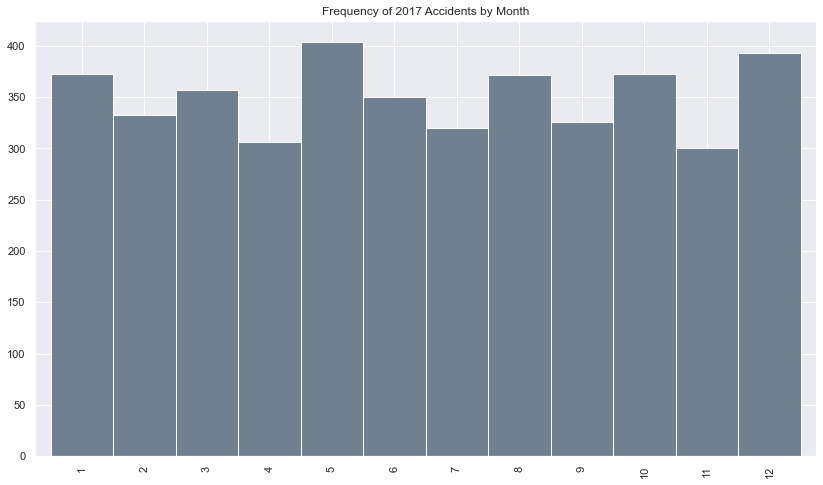

In [50]:
#bar plot of 2017 accident frequencies
atl_2017['month'].value_counts().sort_index().plot(kind = 'bar',
                                                   figsize=(14, 8),
                                                   width = 1,
                                                   color = 'slategrey',
                                                   title = 'Frequency of 2017 Accidents by Month');

In [51]:
atl_2018.head(3)

,severity,start_lat,start_lng,end_lat,end_lng,distance(mi),temperature(f),wind_chill(f),humidity(%),pressure(in),visibility(mi),wind_speed(mph),precipitation(in),amenity,bump,crossing,give_way,junction,no_exit,railway,roundabout,station,stop,traffic_calming,traffic_signal,turning_loop,start_time_ep,end_time_ep,weather_timestamp_ep,year,month,week,accident_duration,side_L,side_R,wind_direction_CALM,wind_direction_E,wind_direction_ENE,wind_direction_ESE,wind_direction_N,wind_direction_NE,wind_direction_NNE,wind_direction_NNW,wind_direction_NW,wind_direction_S,wind_direction_SE,wind_direction_SSE,wind_direction_SSW,wind_direction_SW,wind_direction_VAR,wind_direction_W,wind_direction_WNW,wind_direction_WSW,weather_condition_Clear,weather_condition_Cloudy,weather_condition_Cloudy / Windy,weather_condition_Drizzle,weather_condition_Drizzle and Fog,weather_condition_Fair,weather_condition_Fair / Windy,weather_condition_Fog,weather_condition_Haze,weather_condition_Heavy Drizzle,weather_condition_Heavy Rain,weather_condition_Heavy Rain / Windy,weather_condition_Heavy Rain Shower,weather_condition_Heavy T-Storm,weather_condition_Heavy Thunderstorms and Rain,weather_condition_Light Drizzle,weather_condition_Light Drizzle / Windy,weather_condition_Light Freezing Rain,weather_condition_Light Ice Pellets,weather_condition_Light Rain,weather_condition_Light Rain / Windy,weather_condition_Light Rain Shower,weather_condition_Light Rain with Thunder,weather_condition_Light Snow,weather_condition_Light Snow / Windy,weather_condition_Light Thunderstorms and Rain,weather_condition_Mist,weather_condition_Mostly Cloudy,weather_condition_Mostly Cloudy / Windy,weather_condition_N/A Precipitation,weather_condition_Overcast,weather_condition_Partly Cloudy,weather_condition_Partly Cloudy / Windy,weather_condition_Rain,weather_condition_Rain / Windy,weather_condition_Rain Shower,weather_condition_Rain Showers,weather_condition_Scattered Clouds,weather_condition_Smoke,weather_condition_Snow,weather_condition_Squalls / Windy,weather_condition_T-Storm / Windy,weather_condition_Thunder,weather_condition_Thunder / Windy,weather_condition_Thunder in the Vicinity,weather_condition_Thunderstorm,weather_condition_Thunderstorms and Rain,weather_condition_Wintry Mix,weather_condition_Wintry Mix / Windy,sunrise_sunset_Day,sunrise_sunset_Night,sunrise_sunset_nan,civil_twilight_Day,civil_twilight_Night,civil_twilight_nan,nautical_twilight_Day,nautical_twilight_Night,nautical_twilight_nan,astronomical_twilight_Day,astronomical_twilight_Night,astronomical_twilight_nan,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday,hour_00,hour_01,hour_02,hour_03,hour_04,hour_05,hour_06,hour_07,hour_08,hour_09,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23
14689,4,33.79710,-84.48744,33.79958,-84.48833,0.179,55.9,55.9,69.0,30.09,10.0,6.979359,0.00,0,0,0,0,1,0,0,0,0,0,0,0,0,1.543540e+09,1.543541e+09,1.543539e+09,2018,11,47,1764.0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14690,2,33.91020,-84.36613,33.90999,-84.36373,0.138,51.1,51.1,89.0,30.10,10.0,8.100000,0.01,0,0,0,0,1,0,0,0,0,0,0,0,0,1.543560e+09,1.543562e+09,1.543561e+09,2018,11,47,1792.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14691,2,33.94517,-84.14420,33.94839,-84.13759,0.439,52.0,52.0,80.0,30.12,10.0,6.900000,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,1.543561e+09,1.543563e+09,1.543561e+09,2018,11,47,1775.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,

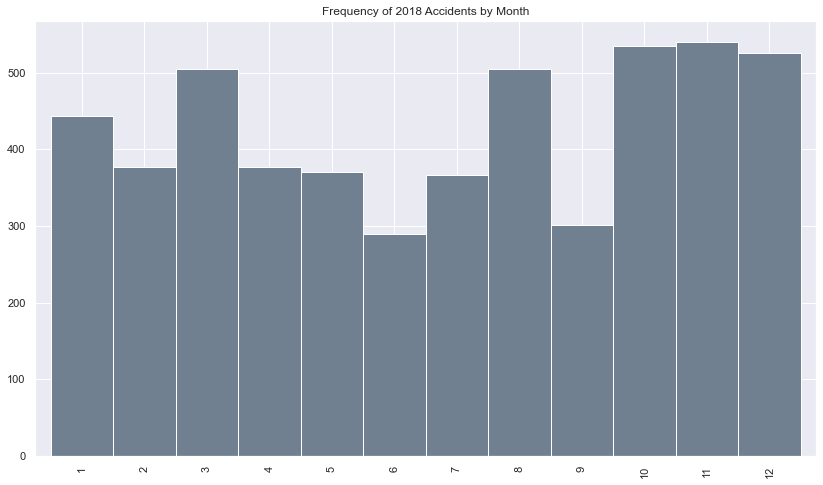

In [52]:
#bar plot of 2018 accident frequencies
atl_2018['month'].value_counts().sort_index().plot(kind = 'bar',
                                                   figsize=(14, 8),
                                                   width = 1,
                                                   color = 'slategrey',
                                                   title = 'Frequency of 2018 Accidents by Month');

In [53]:
atl_2019.head(3)

,severity,start_lat,start_lng,end_lat,end_lng,distance(mi),temperature(f),wind_chill(f),humidity(%),pressure(in),visibility(mi),wind_speed(mph),precipitation(in),amenity,bump,crossing,give_way,junction,no_exit,railway,roundabout,station,stop,traffic_calming,traffic_signal,turning_loop,start_time_ep,end_time_ep,weather_timestamp_ep,year,month,week,accident_duration,side_L,side_R,wind_direction_CALM,wind_direction_E,wind_direction_ENE,wind_direction_ESE,wind_direction_N,wind_direction_NE,wind_direction_NNE,wind_direction_NNW,wind_direction_NW,wind_direction_S,wind_direction_SE,wind_direction_SSE,wind_direction_SSW,wind_direction_SW,wind_direction_VAR,wind_direction_W,wind_direction_WNW,wind_direction_WSW,weather_condition_Clear,weather_condition_Cloudy,weather_condition_Cloudy / Windy,weather_condition_Drizzle,weather_condition_Drizzle and Fog,weather_condition_Fair,weather_condition_Fair / Windy,weather_condition_Fog,weather_condition_Haze,weather_condition_Heavy Drizzle,weather_condition_Heavy Rain,weather_condition_Heavy Rain / Windy,weather_condition_Heavy Rain Shower,weather_condition_Heavy T-Storm,weather_condition_Heavy Thunderstorms and Rain,weather_condition_Light Drizzle,weather_condition_Light Drizzle / Windy,weather_condition_Light Freezing Rain,weather_condition_Light Ice Pellets,weather_condition_Light Rain,weather_condition_Light Rain / Windy,weather_condition_Light Rain Shower,weather_condition_Light Rain with Thunder,weather_condition_Light Snow,weather_condition_Light Snow / Windy,weather_condition_Light Thunderstorms and Rain,weather_condition_Mist,weather_condition_Mostly Cloudy,weather_condition_Mostly Cloudy / Windy,weather_condition_N/A Precipitation,weather_condition_Overcast,weather_condition_Partly Cloudy,weather_condition_Partly Cloudy / Windy,weather_condition_Rain,weather_condition_Rain / Windy,weather_condition_Rain Shower,weather_condition_Rain Showers,weather_condition_Scattered Clouds,weather_condition_Smoke,weather_condition_Snow,weather_condition_Squalls / Windy,weather_condition_T-Storm / Windy,weather_condition_Thunder,weather_condition_Thunder / Windy,weather_condition_Thunder in the Vicinity,weather_condition_Thunderstorm,weather_condition_Thunderstorms and Rain,weather_condition_Wintry Mix,weather_condition_Wintry Mix / Windy,sunrise_sunset_Day,sunrise_sunset_Night,sunrise_sunset_nan,civil_twilight_Day,civil_twilight_Night,civil_twilight_nan,nautical_twilight_Day,nautical_twilight_Night,nautical_twilight_nan,astronomical_twilight_Day,astronomical_twilight_Night,astronomical_twilight_nan,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday,hour_00,hour_01,hour_02,hour_03,hour_04,hour_05,hour_06,hour_07,hour_08,hour_09,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23
12250,4,34.28200,-83.80754,34.32210,-83.78784,2.990,50.0,50.0,100.0,28.59,3.0,20.0,0.05,0,0,0,0,0,0,0,0,0,0,0,0,0,1.577083e+09,1.577085e+09,1.577084e+09,2019,12,51,1788.0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
12251,2,33.92969,-84.17363,33.92812,-84.17693,0.218,50.0,50.0,93.0,28.84,2.0,9.0,0.03,0,0,0,0,0,0,0,0,0,0,0,0,0,1.577086e+09,1.577088e+09,1.577088e+09,2019,12,51,1789.0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
12252,4,34.01117,-85.12274,34.01175,-85.12459,0.113,52.0,52.0,100.0,28.59,10.0,7.0,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,1.577144e+09,1.577146e+09,1.577144e+09,2019,12,51,1689.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

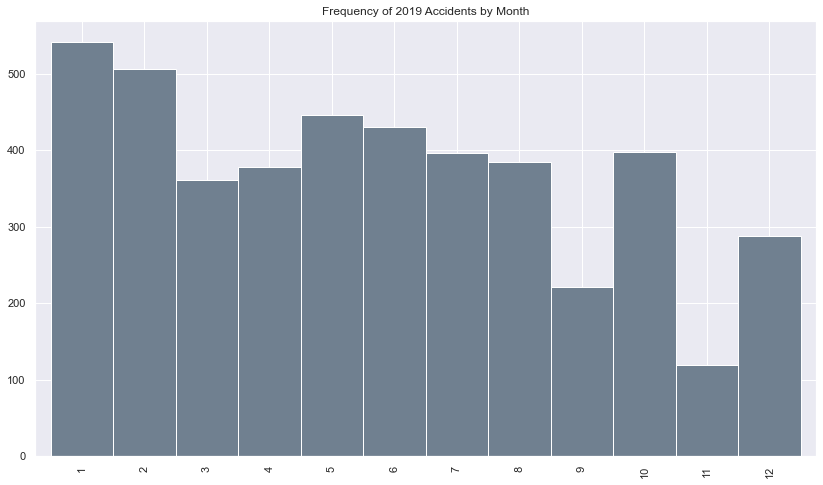

In [54]:
#bar plot of 2019 accident frequencies
atl_2019['month'].value_counts().sort_index().plot(kind = 'bar',
                                                   figsize=(14, 8),
                                                   width = 1,
                                                   color = 'slategrey',
                                                   title = 'Frequency of 2019 Accidents by Month');

In [55]:
atl_2020.head(3)

,severity,start_lat,start_lng,end_lat,end_lng,distance(mi),temperature(f),wind_chill(f),humidity(%),pressure(in),visibility(mi),wind_speed(mph),precipitation(in),amenity,bump,crossing,give_way,junction,no_exit,railway,roundabout,station,stop,traffic_calming,traffic_signal,turning_loop,start_time_ep,end_time_ep,weather_timestamp_ep,year,month,week,accident_duration,side_L,side_R,wind_direction_CALM,wind_direction_E,wind_direction_ENE,wind_direction_ESE,wind_direction_N,wind_direction_NE,wind_direction_NNE,wind_direction_NNW,wind_direction_NW,wind_direction_S,wind_direction_SE,wind_direction_SSE,wind_direction_SSW,wind_direction_SW,wind_direction_VAR,wind_direction_W,wind_direction_WNW,wind_direction_WSW,weather_condition_Clear,weather_condition_Cloudy,weather_condition_Cloudy / Windy,weather_condition_Drizzle,weather_condition_Drizzle and Fog,weather_condition_Fair,weather_condition_Fair / Windy,weather_condition_Fog,weather_condition_Haze,weather_condition_Heavy Drizzle,weather_condition_Heavy Rain,weather_condition_Heavy Rain / Windy,weather_condition_Heavy Rain Shower,weather_condition_Heavy T-Storm,weather_condition_Heavy Thunderstorms and Rain,weather_condition_Light Drizzle,weather_condition_Light Drizzle / Windy,weather_condition_Light Freezing Rain,weather_condition_Light Ice Pellets,weather_condition_Light Rain,weather_condition_Light Rain / Windy,weather_condition_Light Rain Shower,weather_condition_Light Rain with Thunder,weather_condition_Light Snow,weather_condition_Light Snow / Windy,weather_condition_Light Thunderstorms and Rain,weather_condition_Mist,weather_condition_Mostly Cloudy,weather_condition_Mostly Cloudy / Windy,weather_condition_N/A Precipitation,weather_condition_Overcast,weather_condition_Partly Cloudy,weather_condition_Partly Cloudy / Windy,weather_condition_Rain,weather_condition_Rain / Windy,weather_condition_Rain Shower,weather_condition_Rain Showers,weather_condition_Scattered Clouds,weather_condition_Smoke,weather_condition_Snow,weather_condition_Squalls / Windy,weather_condition_T-Storm / Windy,weather_condition_Thunder,weather_condition_Thunder / Windy,weather_condition_Thunder in the Vicinity,weather_condition_Thunderstorm,weather_condition_Thunderstorms and Rain,weather_condition_Wintry Mix,weather_condition_Wintry Mix / Windy,sunrise_sunset_Day,sunrise_sunset_Night,sunrise_sunset_nan,civil_twilight_Day,civil_twilight_Night,civil_twilight_nan,nautical_twilight_Day,nautical_twilight_Night,nautical_twilight_nan,astronomical_twilight_Day,astronomical_twilight_Night,astronomical_twilight_nan,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday,hour_00,hour_01,hour_02,hour_03,hour_04,hour_05,hour_06,hour_07,hour_08,hour_09,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23
4908,4,34.249616,-84.093856,34.256224,-84.091312,0.479,28.0,17.0,39.0,28.63,10.0,13.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.608901e+09,1.608911e+09,1.608901e+09,2020,12,51,10140.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4909,2,33.944331,-84.509958,33.937641,-84.499248,0.768,65.0,65.0,43.0,28.99,10.0,13.0,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,1.602870e+09,1.602876e+09,1.602871e+09,2020,10,41,5640.0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4910,2,33.886826,-84.266649,33.880455,-84.272057,0.539,44.0,37.0,68.0,28.77,10.0,16.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.607351e+09,1.607378e+09,1.607350e+09,2020,12,49,27030.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,

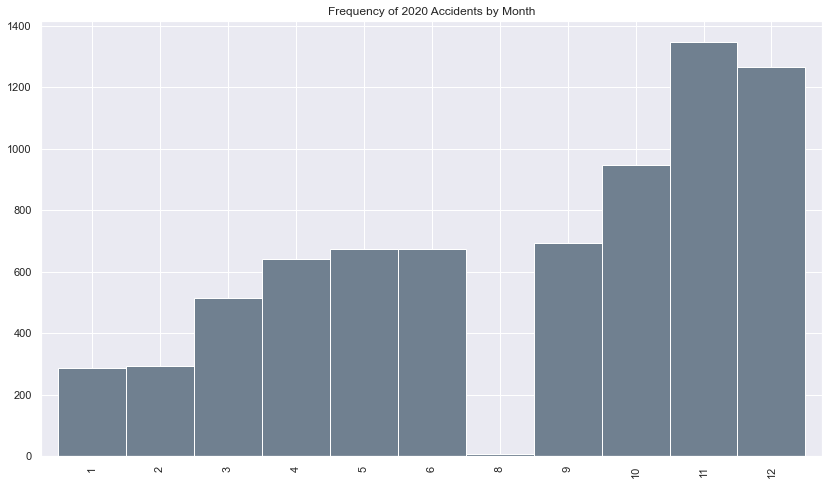

In [56]:
#bar plot of 2020 accident frequencies
atl_2020['month'].value_counts().sort_index().plot(kind = 'bar',
                                                   figsize=(14, 8),
                                                   width = 1,
                                                   color = 'slategrey',
                                                   title = 'Frequency of 2020 Accidents by Month');

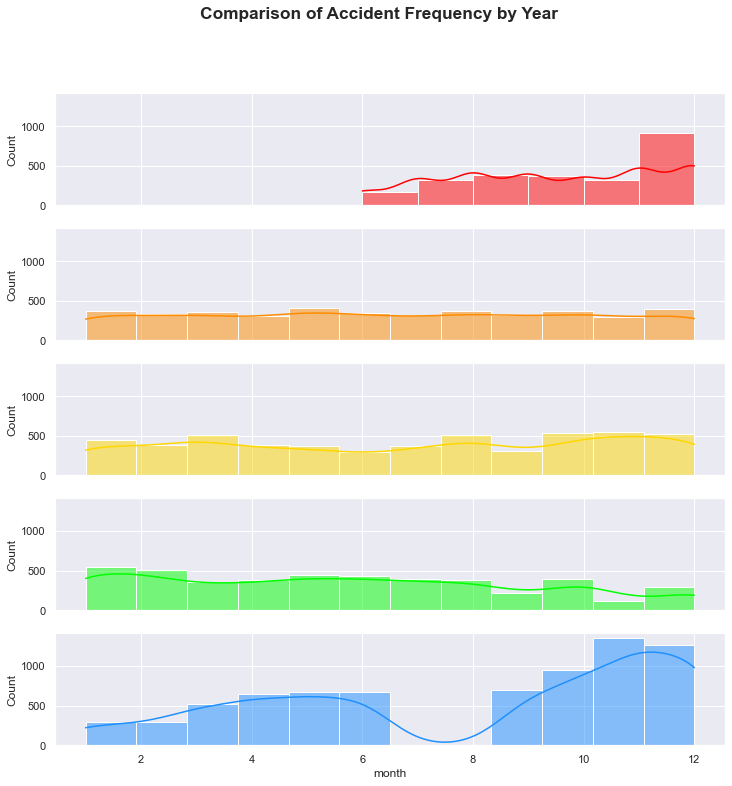

In [57]:
#setting up subplots and figsize:
fig, axs = plt.subplots(5, 1, 
                        sharex = True, 
                        sharey = True, 
                        figsize = (12, 12))

#setting title for 'overall' plot
fig.suptitle('Comparison of Accident Frequency by Year',
               fontsize = 'x-large', 
               fontweight = 'bold' )

#individual subplots:
sns.histplot(data = atl_2016, x = "month", 
             color = "red", bins = 6, 
             kde = True, ax = axs[0])
sns.histplot(data = atl_2017, x = "month", 
             color = "darkorange", bins = 12, 
             kde = True, ax = axs[1])
sns.histplot(data = atl_2018, x = "month", 
             color = "gold", bins = 12, 
             kde = True, ax = axs[2])
sns.histplot(data = atl_2019, x = "month", 
             color = "lime", bins = 12, 
             kde = True, ax = axs[3])
sns.histplot(data = atl_2020, x = "month", 
             color = "dodgerblue", bins = 12, 
             kde = True, ax = axs[4])

#displaying plot:
plt.show()

In [58]:
#the earliest available dates are in June 2016

atl_2016_11 = atl_2016.loc[atl_2016['month'] == 11]
atl_2016_11.head(3)

,severity,start_lat,start_lng,end_lat,end_lng,distance(mi),temperature(f),wind_chill(f),humidity(%),pressure(in),visibility(mi),wind_speed(mph),precipitation(in),amenity,bump,crossing,give_way,junction,no_exit,railway,roundabout,station,stop,traffic_calming,traffic_signal,turning_loop,start_time_ep,end_time_ep,weather_timestamp_ep,year,month,week,accident_duration,side_L,side_R,wind_direction_CALM,wind_direction_E,wind_direction_ENE,wind_direction_ESE,wind_direction_N,wind_direction_NE,wind_direction_NNE,wind_direction_NNW,wind_direction_NW,wind_direction_S,wind_direction_SE,wind_direction_SSE,wind_direction_SSW,wind_direction_SW,wind_direction_VAR,wind_direction_W,wind_direction_WNW,wind_direction_WSW,weather_condition_Clear,weather_condition_Cloudy,weather_condition_Cloudy / Windy,weather_condition_Drizzle,weather_condition_Drizzle and Fog,weather_condition_Fair,weather_condition_Fair / Windy,weather_condition_Fog,weather_condition_Haze,weather_condition_Heavy Drizzle,weather_condition_Heavy Rain,weather_condition_Heavy Rain / Windy,weather_condition_Heavy Rain Shower,weather_condition_Heavy T-Storm,weather_condition_Heavy Thunderstorms and Rain,weather_condition_Light Drizzle,weather_condition_Light Drizzle / Windy,weather_condition_Light Freezing Rain,weather_condition_Light Ice Pellets,weather_condition_Light Rain,weather_condition_Light Rain / Windy,weather_condition_Light Rain Shower,weather_condition_Light Rain with Thunder,weather_condition_Light Snow,weather_condition_Light Snow / Windy,weather_condition_Light Thunderstorms and Rain,weather_condition_Mist,weather_condition_Mostly Cloudy,weather_condition_Mostly Cloudy / Windy,weather_condition_N/A Precipitation,weather_condition_Overcast,weather_condition_Partly Cloudy,weather_condition_Partly Cloudy / Windy,weather_condition_Rain,weather_condition_Rain / Windy,weather_condition_Rain Shower,weather_condition_Rain Showers,weather_condition_Scattered Clouds,weather_condition_Smoke,weather_condition_Snow,weather_condition_Squalls / Windy,weather_condition_T-Storm / Windy,weather_condition_Thunder,weather_condition_Thunder / Windy,weather_condition_Thunder in the Vicinity,weather_condition_Thunderstorm,weather_condition_Thunderstorms and Rain,weather_condition_Wintry Mix,weather_condition_Wintry Mix / Windy,sunrise_sunset_Day,sunrise_sunset_Night,sunrise_sunset_nan,civil_twilight_Day,civil_twilight_Night,civil_twilight_nan,nautical_twilight_Day,nautical_twilight_Night,nautical_twilight_nan,astronomical_twilight_Day,astronomical_twilight_Night,astronomical_twilight_nan,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday,hour_00,hour_01,hour_02,hour_03,hour_04,hour_05,hour_06,hour_07,hour_08,hour_09,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23
0,3,32.83752,-83.64864,32.840424,-83.646307,0.242,66.0,66.0,90.0,29.79,4.0,9.2,0.24,0,0,0,0,1,0,0,0,0,0,0,0,0,1.480527e+09,1.480549e+09,1.480528e+09,2016,11,48,21600.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,2,33.74153,-84.41434,33.746580,-84.430340,0.983,62.6,62.6,100.0,29.80,8.0,9.2,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,1.480528e+09,1.480549e+09,1.480528e+09,2016,11,48,21600.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,2,33.91220,-84.38390,33.911380,-84.372580,0.652,63.0,63.0,90.0,29.80,10.0,9.2,0.00,0,0,0,0,1,0,0,0,0,0,0,0,0,1.480529e+09,1.480551e+09,1.480529e+09,2016,11,48,21600.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0

In [59]:
atl_2017_03 = atl_2017.loc[atl_2017['month'] == 3]
#atl_2017_03.head(3)

atl_2017_11 = atl_2017.loc[atl_2017['month'] == 11]
#atl_2017_11.head(3)

In [60]:
atl_2018_03 = atl_2018.loc[atl_2018['month'] == 3]
#atl_2018_03.head(3)

atl_2018_11 = atl_2018.loc[atl_2018['month'] == 11]
#atl_2018_11.head(3)

In [61]:
atl_2019_03 = atl_2019.loc[atl_2019['month'] == 3]
#atl_2019_03.head(3)

atl_2019_11 = atl_2019.loc[atl_2019['month'] == 11]
#atl_2019_11.head(3)

In [62]:
atl_2020_03 = atl_2020.loc[atl_2020['month'] == 3]
#atl_2020_03.head(3)

atl_2020_11 = atl_2020.loc[atl_2020['month'] == 11]
#atl_2020_11.head(3)

**Feature Engineering**

In [63]:
#making a function to apply to the df to make a new 'label' column
#1 if the accident took place during the week after DST
#0 if the accident took place during any other time of year

#https://stackoverflow.com/questions/59642338/creating-new-column-based-on-condition-on-other-column-in-pandas-dataframe
#https://stackoverflow.com/questions/13628791/determine-whether-integer-is-between-two-other-integers

def is_DST_week(epoch_time):
    if 1478390400 <= epoch_time <= (1478390400 + 604800): 
        return 1
    elif 1489276800 <= epoch_time <= (1489276800 + 604800):
        return 1
    elif 1509840000 <= epoch_time <= (1509840000 + 604800): 
        return 1
    elif 1520726400 <= epoch_time <= (1520726400 + 604800):
        return 1
    elif 1541289600 <= epoch_time <= (1541289600 + 604800):
        return 1
    elif 1552176000 <= epoch_time <= (1552176000 + 604800):
        return 1
    elif 1572739200 <= epoch_time <= (1572739200 + 604800):
        return 1
    elif 1583625600 <= epoch_time <= (1583625600 + 604800):
        return 1
    elif 1604275200 <= epoch_time <= (1604275200 + 604800):
        return 1
    else:
        return 0

atl_df["is_DST"] = atl_df["start_time_ep"].apply(lambda epoch_time: is_DST_week(epoch_time))

In [64]:
atl_df.head(3)

,severity,start_lat,start_lng,end_lat,end_lng,distance(mi),temperature(f),wind_chill(f),humidity(%),pressure(in),visibility(mi),wind_speed(mph),precipitation(in),amenity,bump,crossing,give_way,junction,no_exit,railway,roundabout,station,stop,traffic_calming,traffic_signal,turning_loop,start_time_ep,end_time_ep,weather_timestamp_ep,year,month,week,accident_duration,side_L,side_R,wind_direction_CALM,wind_direction_E,wind_direction_ENE,wind_direction_ESE,wind_direction_N,wind_direction_NE,wind_direction_NNE,wind_direction_NNW,wind_direction_NW,wind_direction_S,wind_direction_SE,wind_direction_SSE,wind_direction_SSW,wind_direction_SW,wind_direction_VAR,wind_direction_W,wind_direction_WNW,wind_direction_WSW,weather_condition_Clear,weather_condition_Cloudy,weather_condition_Cloudy / Windy,weather_condition_Drizzle,weather_condition_Drizzle and Fog,weather_condition_Fair,weather_condition_Fair / Windy,weather_condition_Fog,weather_condition_Haze,weather_condition_Heavy Drizzle,weather_condition_Heavy Rain,weather_condition_Heavy Rain / Windy,weather_condition_Heavy Rain Shower,weather_condition_Heavy T-Storm,weather_condition_Heavy Thunderstorms and Rain,weather_condition_Light Drizzle,weather_condition_Light Drizzle / Windy,weather_condition_Light Freezing Rain,weather_condition_Light Ice Pellets,weather_condition_Light Rain,weather_condition_Light Rain / Windy,weather_condition_Light Rain Shower,weather_condition_Light Rain with Thunder,weather_condition_Light Snow,weather_condition_Light Snow / Windy,weather_condition_Light Thunderstorms and Rain,weather_condition_Mist,weather_condition_Mostly Cloudy,weather_condition_Mostly Cloudy / Windy,weather_condition_N/A Precipitation,weather_condition_Overcast,weather_condition_Partly Cloudy,weather_condition_Partly Cloudy / Windy,weather_condition_Rain,weather_condition_Rain / Windy,weather_condition_Rain Shower,weather_condition_Rain Showers,weather_condition_Scattered Clouds,weather_condition_Smoke,weather_condition_Snow,weather_condition_Squalls / Windy,weather_condition_T-Storm / Windy,weather_condition_Thunder,weather_condition_Thunder / Windy,weather_condition_Thunder in the Vicinity,weather_condition_Thunderstorm,weather_condition_Thunderstorms and Rain,weather_condition_Wintry Mix,weather_condition_Wintry Mix / Windy,sunrise_sunset_Day,sunrise_sunset_Night,sunrise_sunset_nan,civil_twilight_Day,civil_twilight_Night,civil_twilight_nan,nautical_twilight_Day,nautical_twilight_Night,nautical_twilight_nan,astronomical_twilight_Day,astronomical_twilight_Night,astronomical_twilight_nan,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday,hour_00,hour_01,hour_02,hour_03,hour_04,hour_05,hour_06,hour_07,hour_08,hour_09,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23,is_DST
0,3,32.83752,-83.64864,32.840424,-83.646307,0.242,66.0,66.0,90.0,29.79,4.0,9.2,0.24,0,0,0,0,1,0,0,0,0,0,0,0,0,1.480527e+09,1.480549e+09,1.480528e+09,2016,11,48,21600.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1,2,33.74153,-84.41434,33.746580,-84.430340,0.983,62.6,62.6,100.0,29.80,8.0,9.2,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,1.480528e+09,1.480549e+09,1.480528e+09,2016,11,48,21600.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
2,2,33.91220,-84.38390,33.911380,-84.372580,0.652,63.0,63.0,90.0,29.80,10.0,9.2,0.00,0,0,0,0,1,0,0,0,0,0,0,0,0,1.480529e+09,1.480551e+09,1.480529e+09,2016,11,48,21600.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,

In [65]:
atl_df['is_DST'].value_counts()

0    22547
1     1083
Name: is_DST, dtype: int64

In [66]:
atl_df.to_csv('../data/atl_df_cleaned.csv', index = False)